In [1]:
import librosa
import numpy as np
import IPython.display as ipd
import noisereduce as nr
import matplotlib.pyplot as plt
import librosa.display

C:\Users\Mac\Anaconda3\lib\site-packages\tqdm\autonotebook\__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
audio_path = "raw_data/БН_78_1м.wav"
x , sr = librosa.load(audio_path)
sr = 44100

([<matplotlib.lines.Line2D at 0xca68748>], 44100)

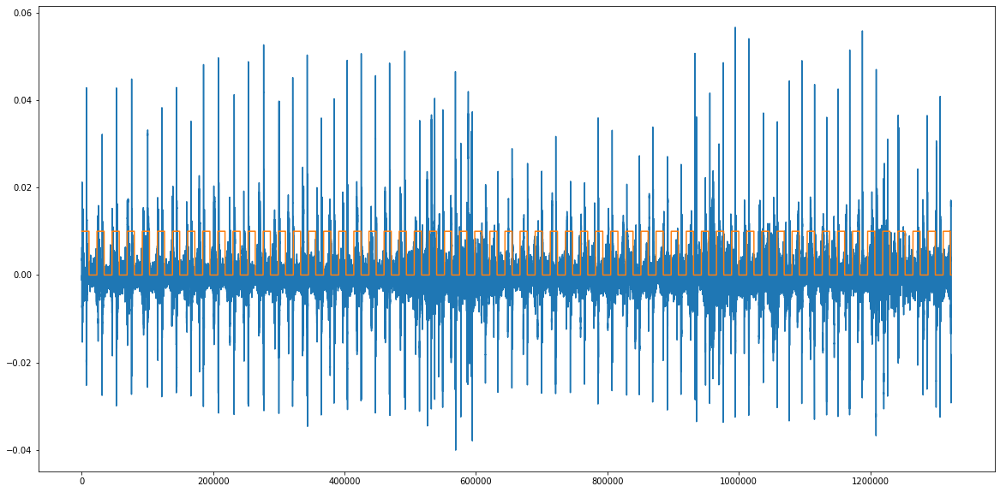

In [36]:
plt.figure(figsize=[20,10])
temp =23000
wide =11000
y = np.zeros(x.shape[0])
for j in range(0,x.shape[0], temp):
    for i in range(wide):
        y[j+i] = 0.01
plt.plot(x[:])
plt.plot(y[:]),sr

(20, 152)


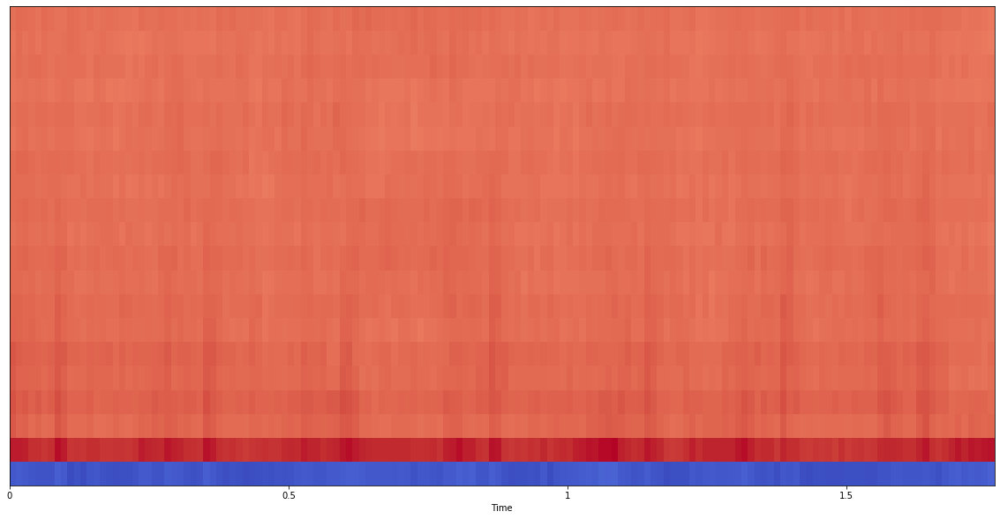

In [13]:
plt.figure(figsize=[20,10])
win = int(4096/2)
mfccs = librosa.feature.mfcc(x[:155000], sr=44100,hop_length=int(win/2),win_length=win)
print(mfccs.shape)
(20, 97)

# Отображение
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


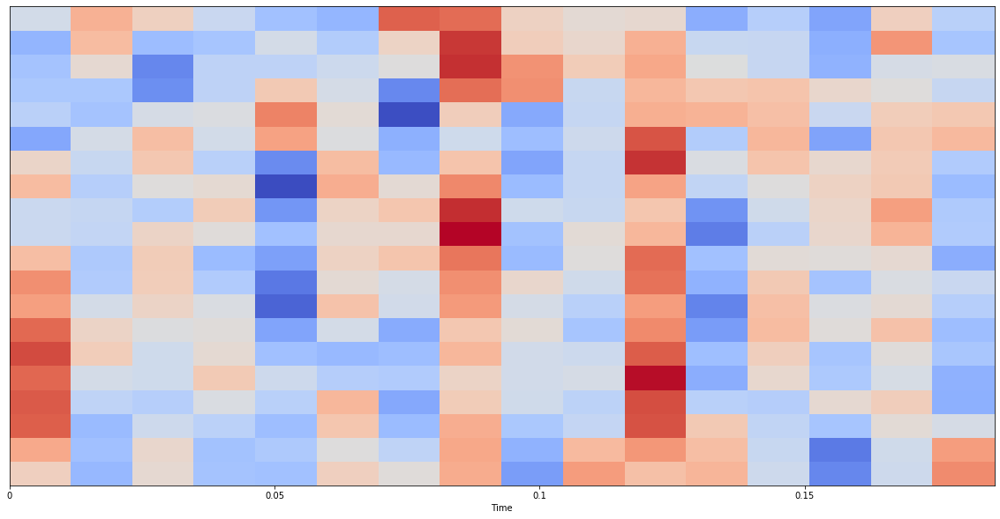

In [8]:
plt.figure(figsize=[20,10])
import sklearn
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


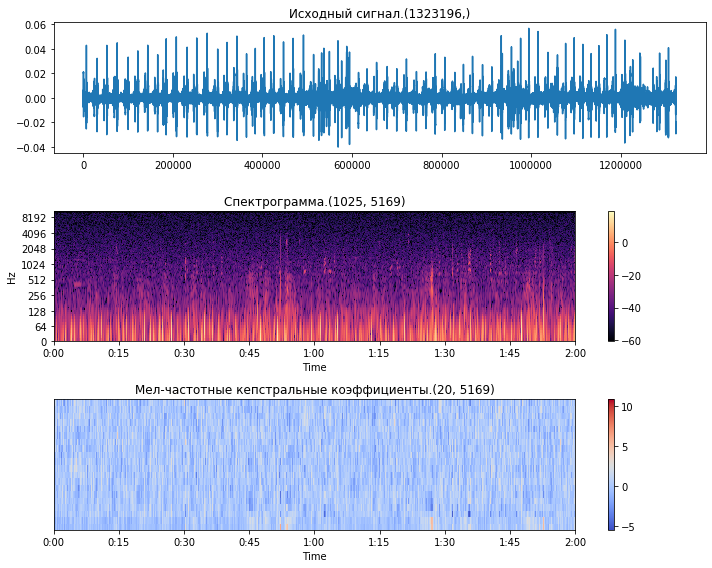

In [40]:
tx = x[:]
win = 512
m_htk = librosa.feature.mfcc(y=tx, sr=sr, hop_length=int(win/2),win_length=win)
m_htk = sklearn.preprocessing.scale(m_htk, axis=1)

X = librosa.stft(tx, hop_length=int(win/2),win_length=win)
m_slaney = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 1)
plt.plot(tx)
plt.title('Исходный сигнал.' +str(tx.shape))
plt.subplot(3, 1, 2)
librosa.display.specshow(m_slaney, x_axis='time',y_axis='log')
plt.title('Спектрограмма.' +str(m_slaney.shape))
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(m_htk, x_axis='time')
plt.title('Мел-частотные кепстральные коэффициенты.'+str(m_htk.shape))
plt.colorbar()
plt.tight_layout()
plt.show()


0


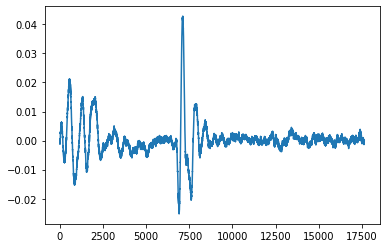

1


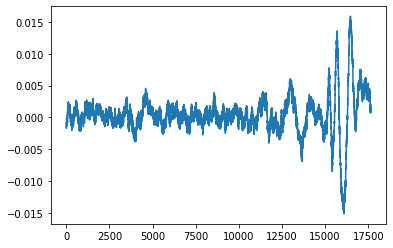

2


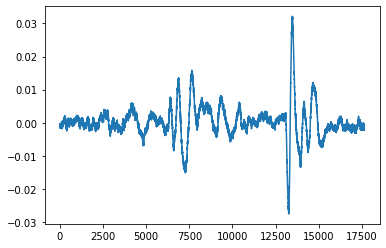

3


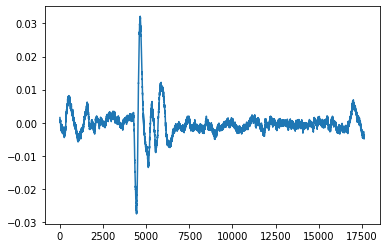

4


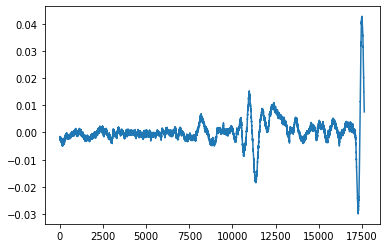

5


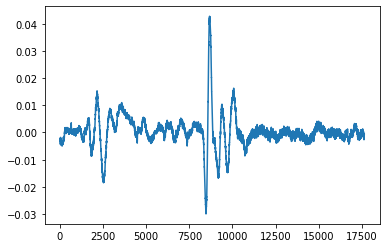

6


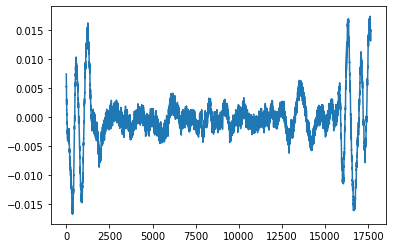

7


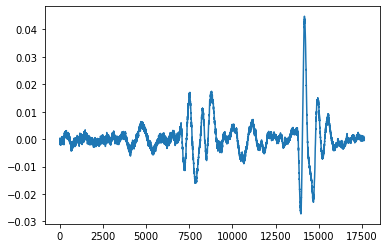

8


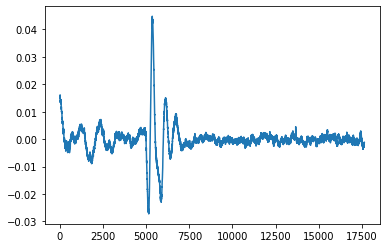

9


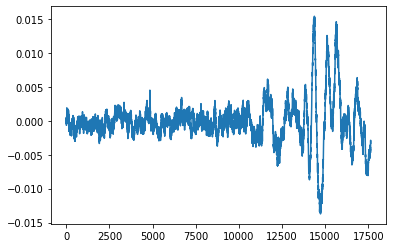

10


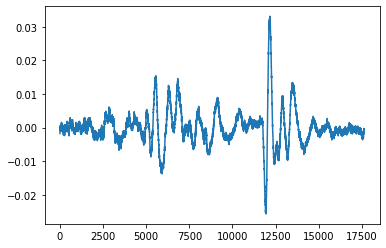

11


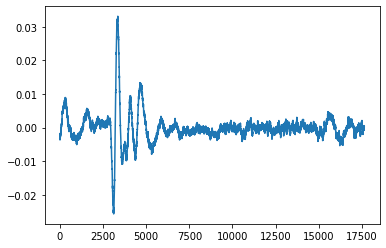

12


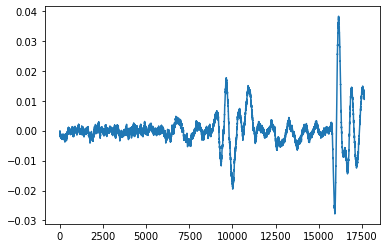

13


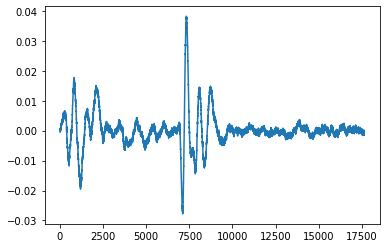

14


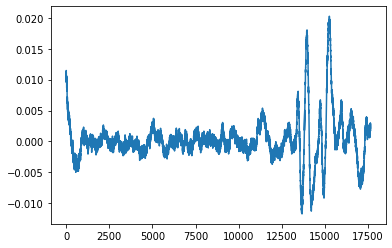

15


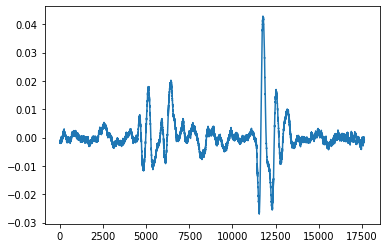

16


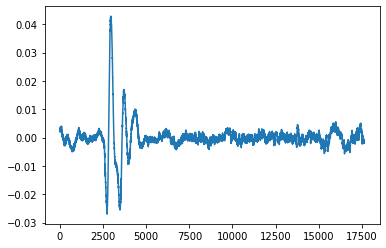

17


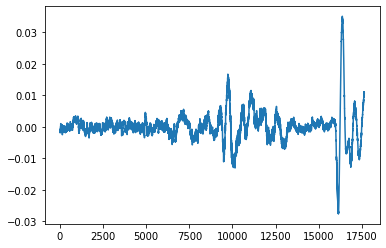

18


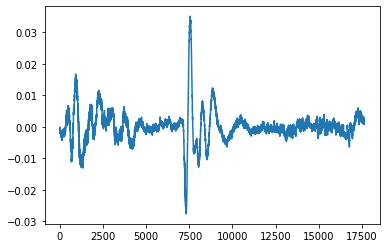

19


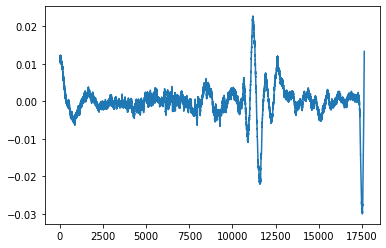

20


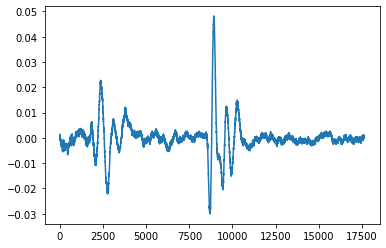

21


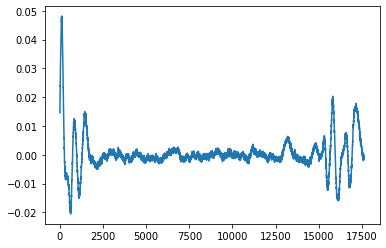

22


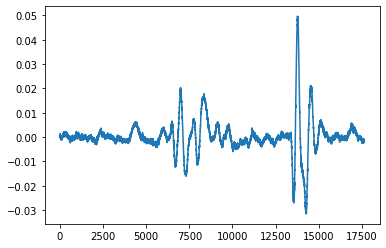

23


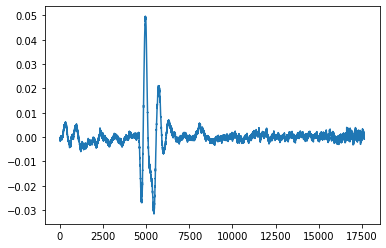

24


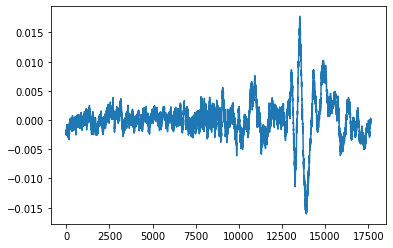

25


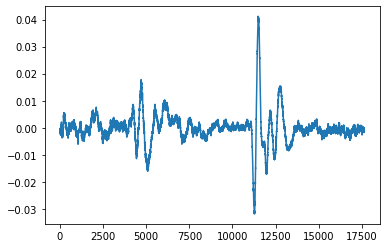

26


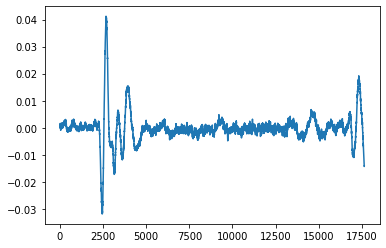

27


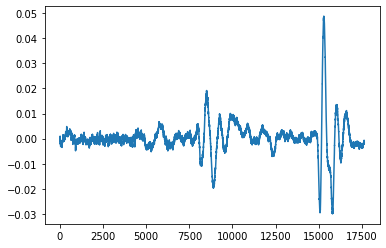

28


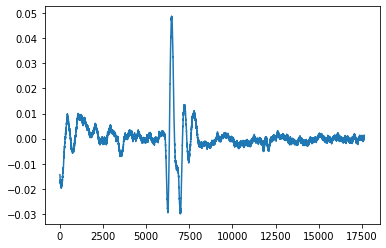

29


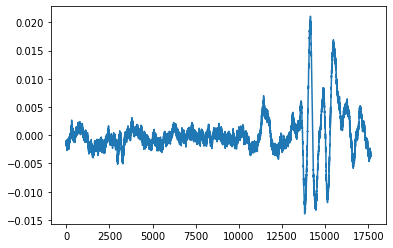

30


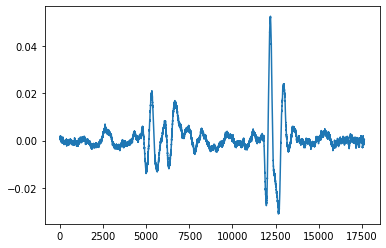

31


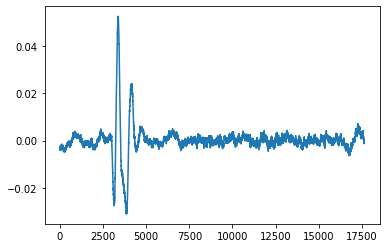

32


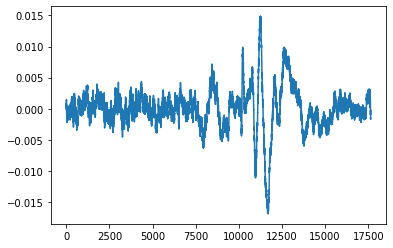

33


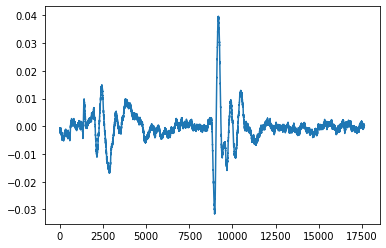

34


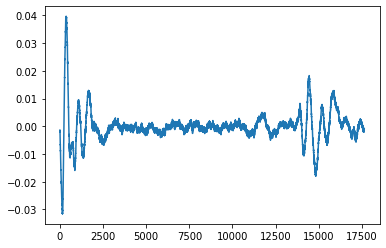

35


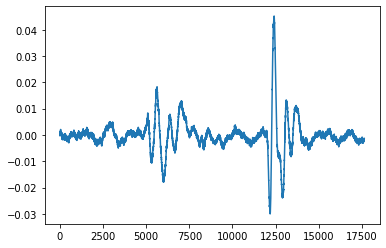

36


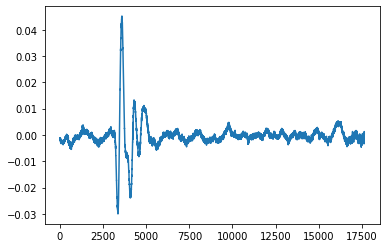

37


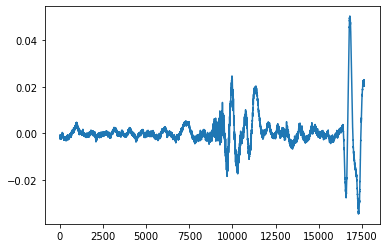

38


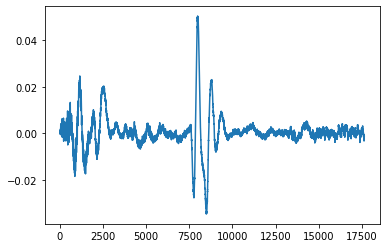

39


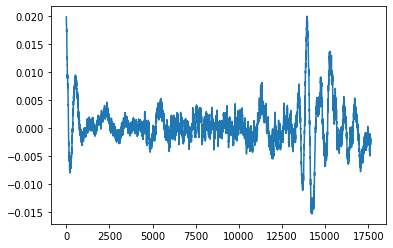

40


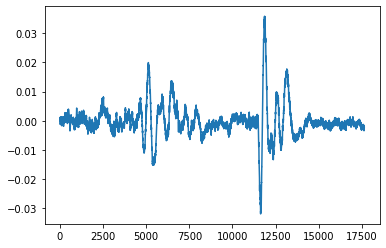

41


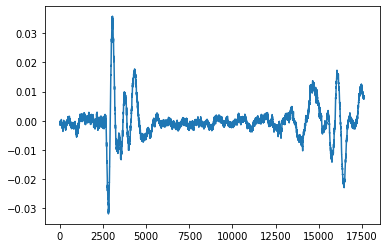

42


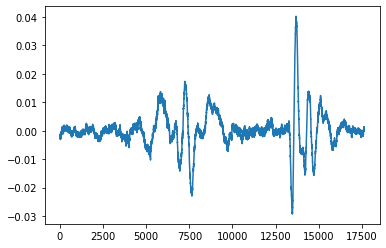

43


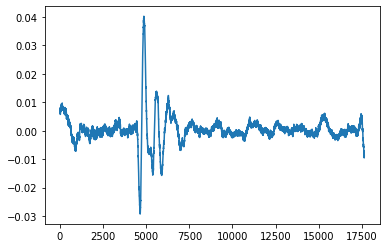

44


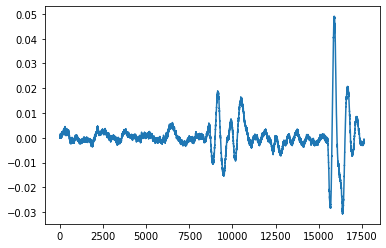

45


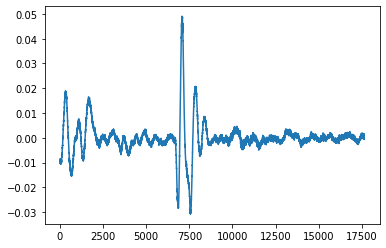

46


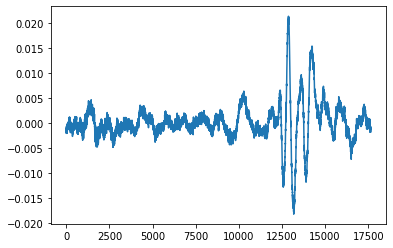

47


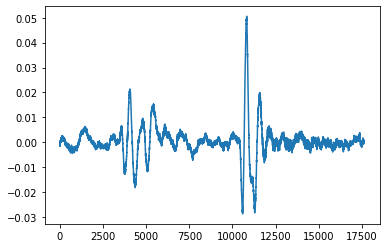

48


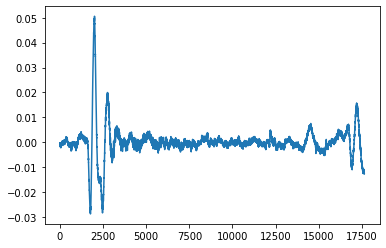

49


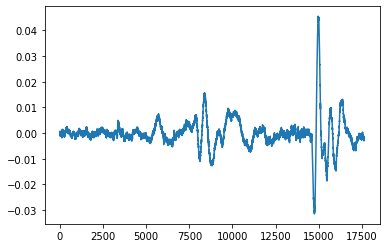

50


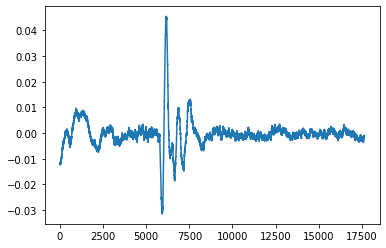

51


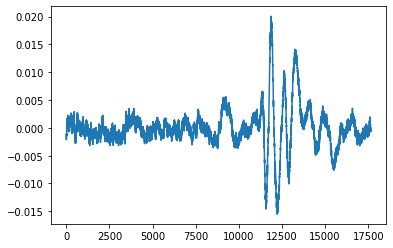

52


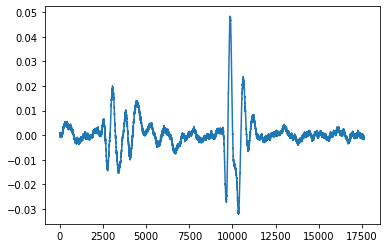

53


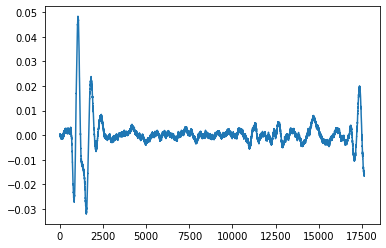

54


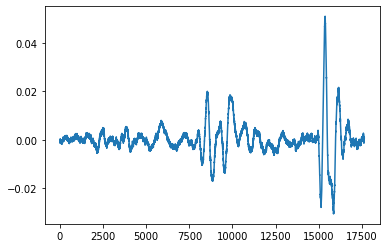

55


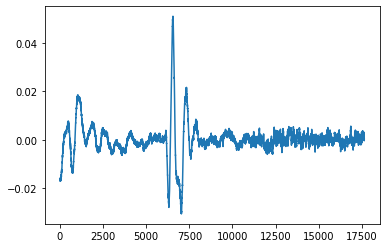

56


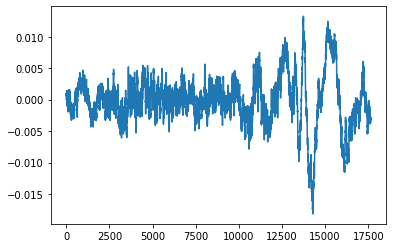

57


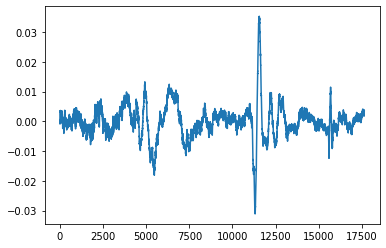

58


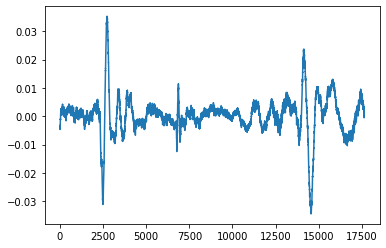

59


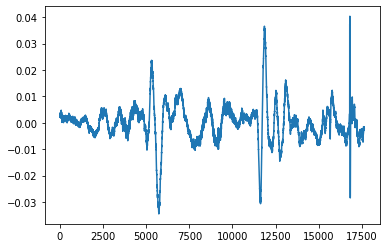

60


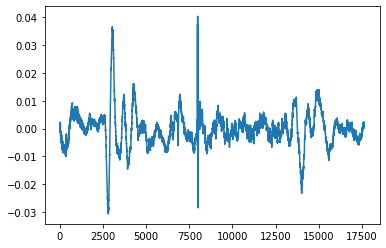

61


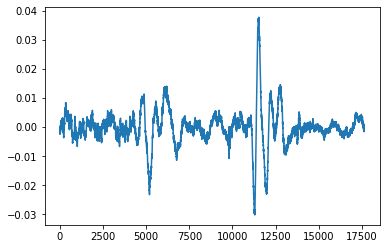

62


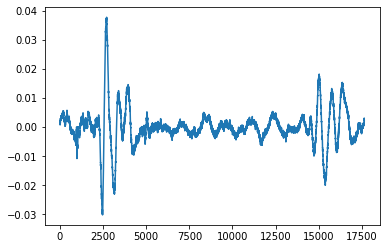

63


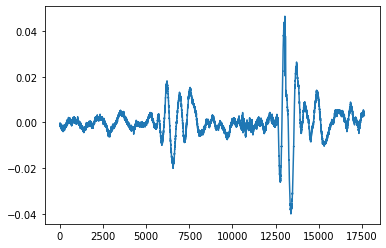

64


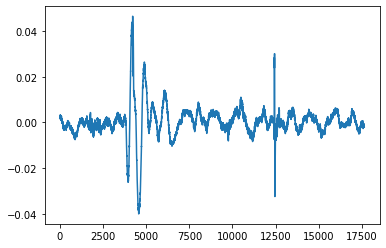

65


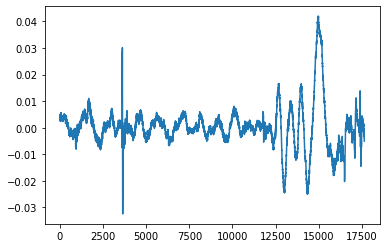

66


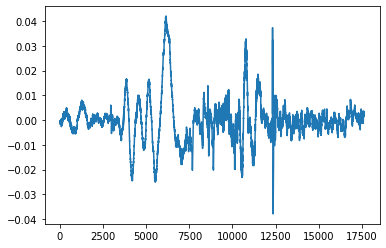

67


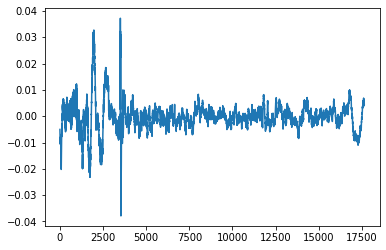

68


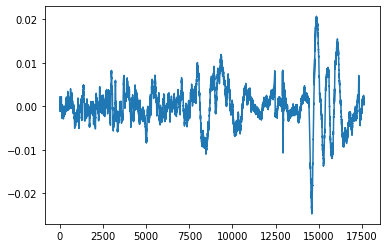

69


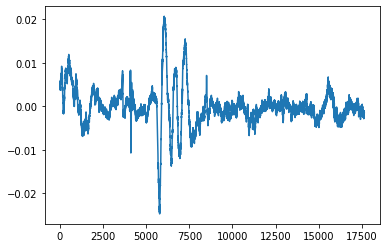

70


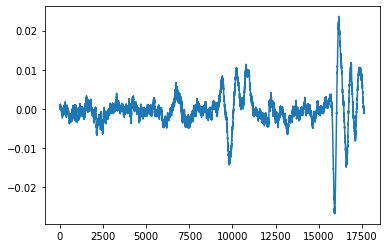

71


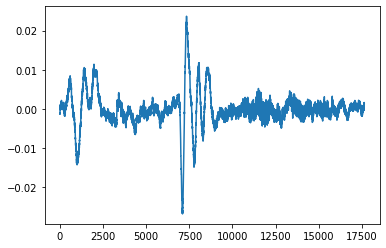

72


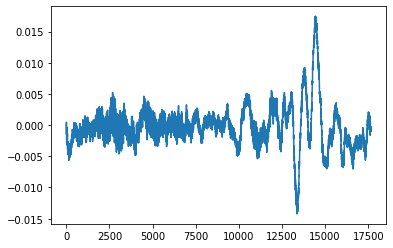

73


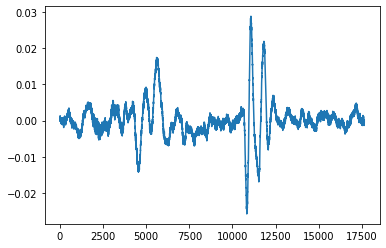

74


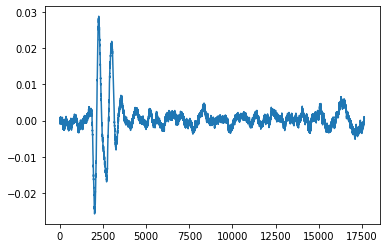

75


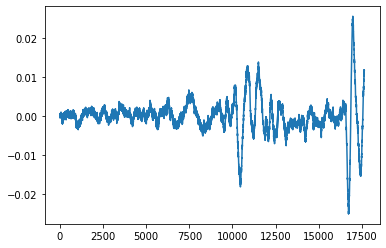

76


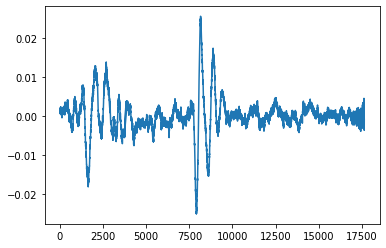

77


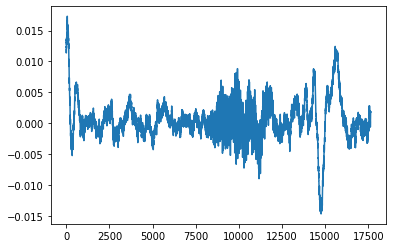

78


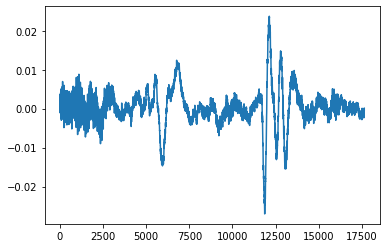

79


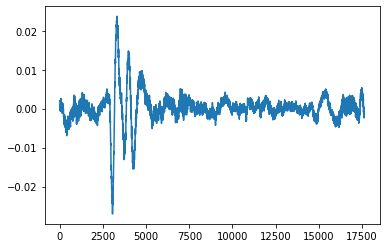

80


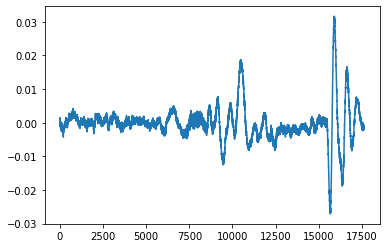

81


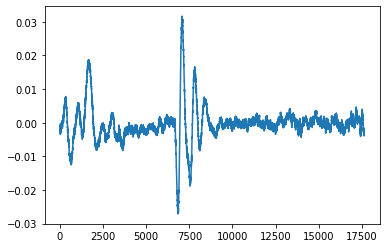

82


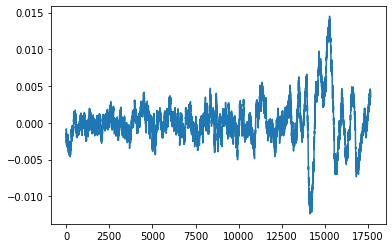

83


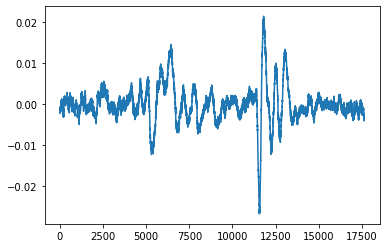

84


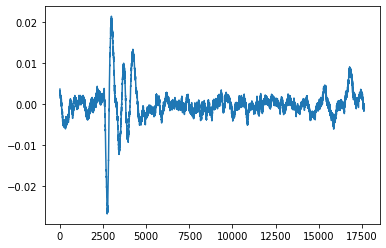

85


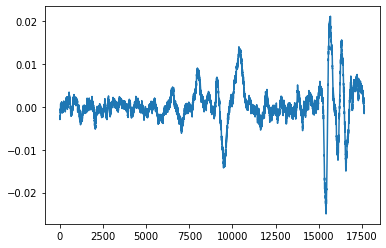

86


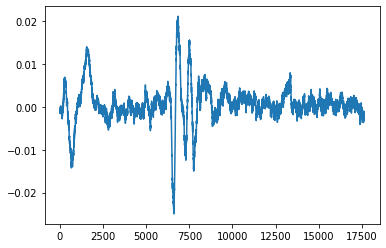

87


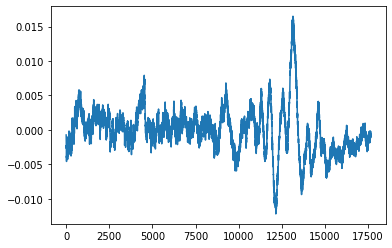

88


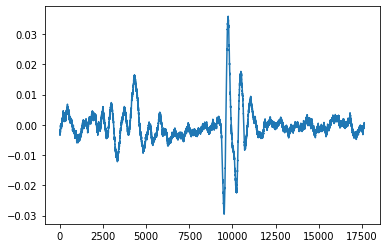

89


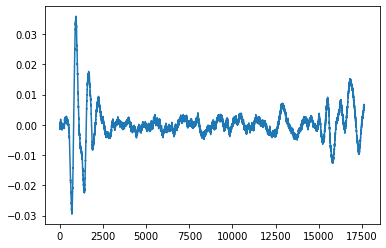

90


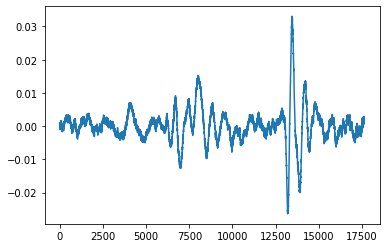

91


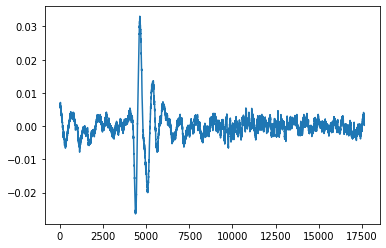

92


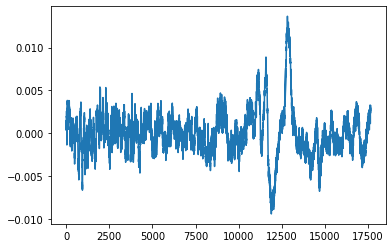

93


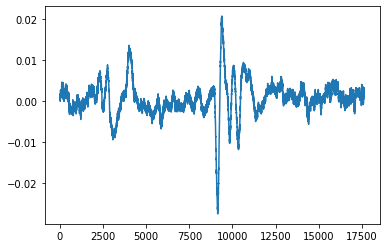

94


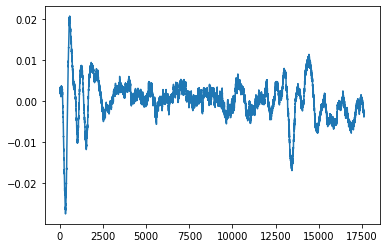

95


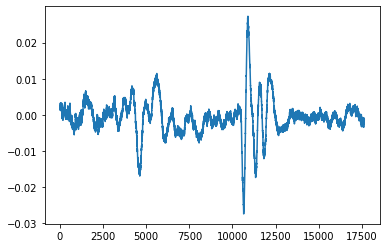

96


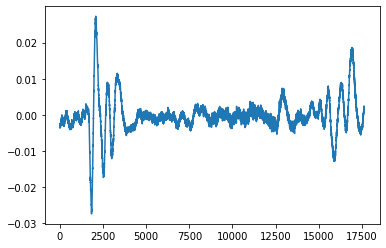

97


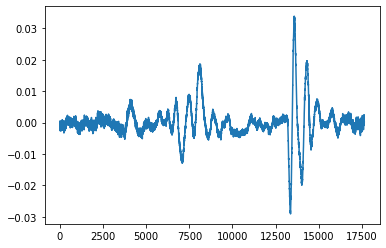

98


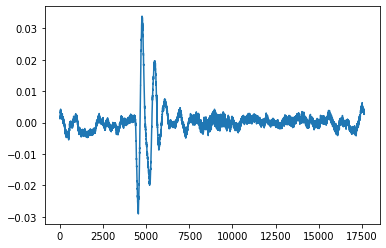

99


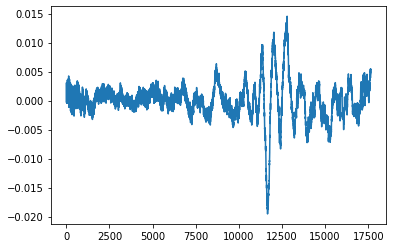

100


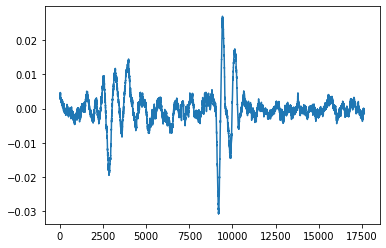

101


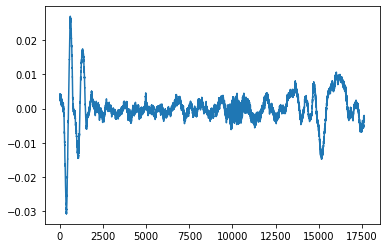

102


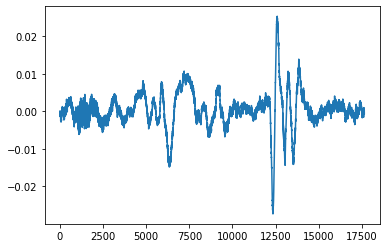

103


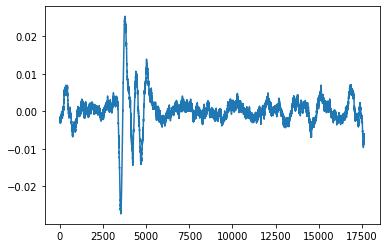

104


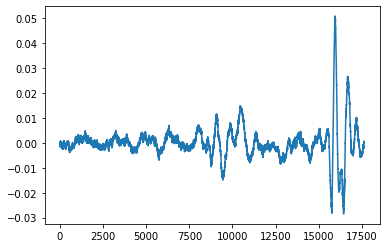

105


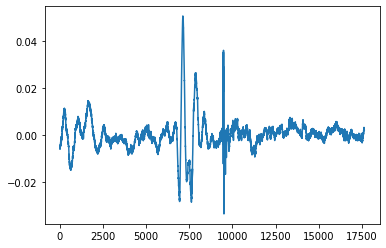

106


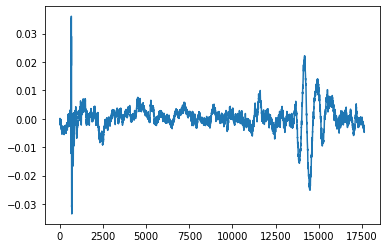

107


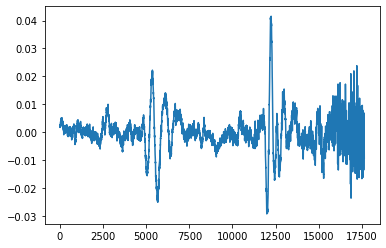

108


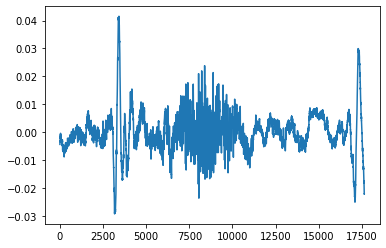

109


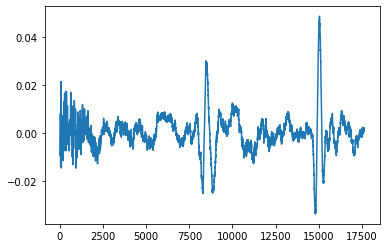

110


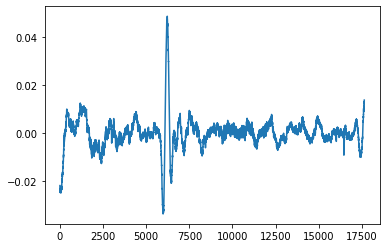

111


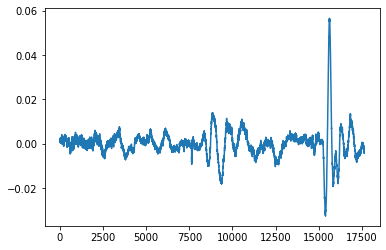

112


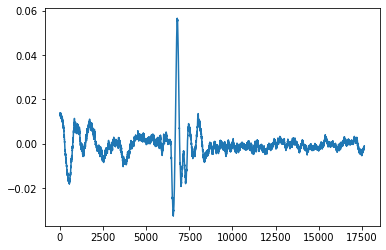

113


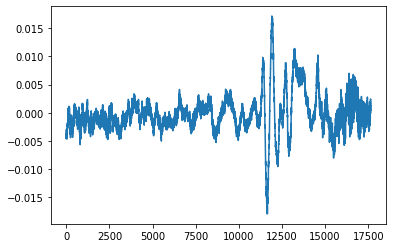

114


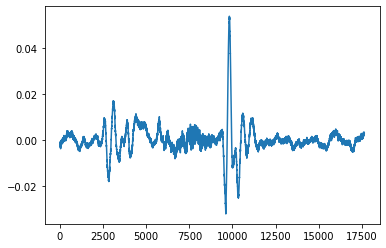

115


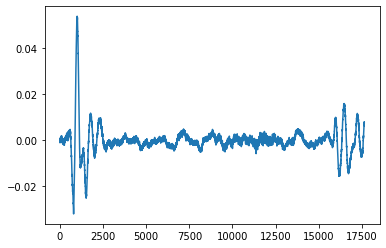

116


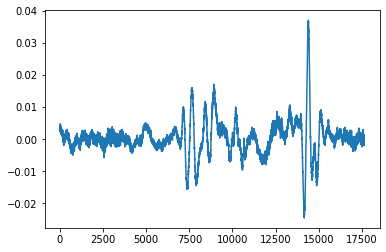

1
117


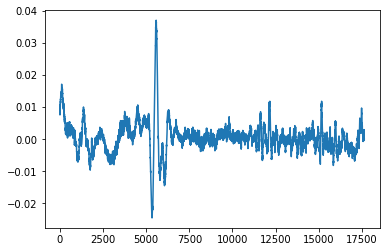

0
118


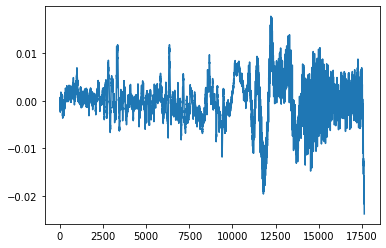

0
119


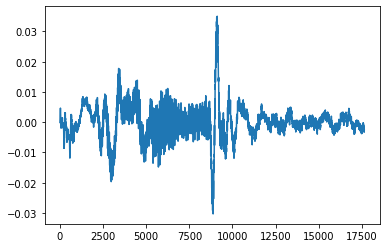

0
120


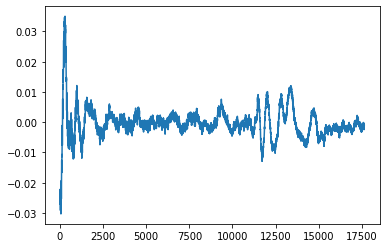

0
121


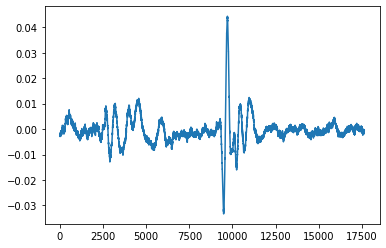

1
122


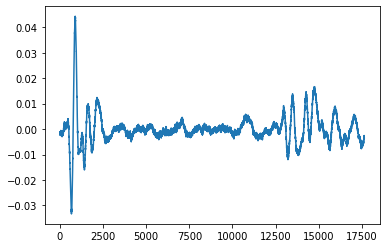

0
123


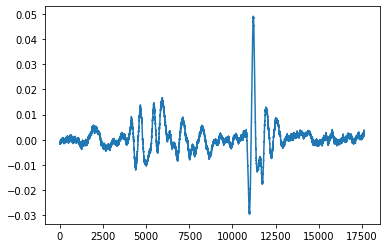

1
124


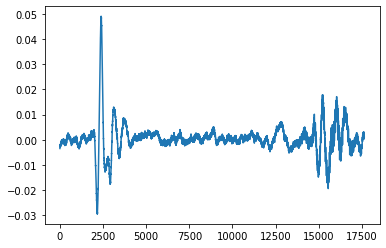

0
125


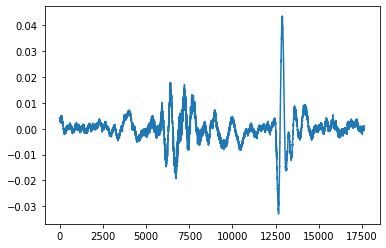

1
126


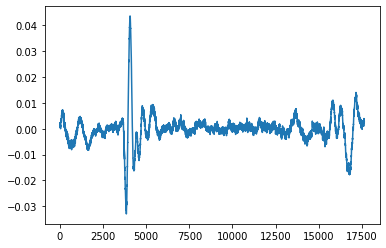

0
127


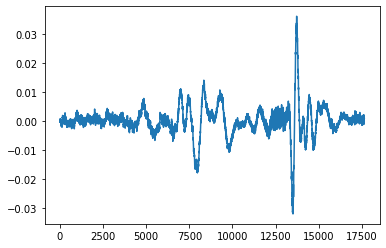

1
128


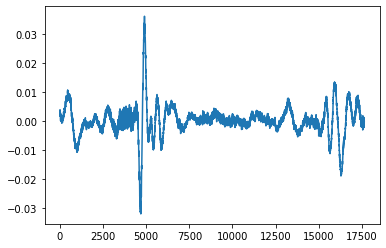

0
129


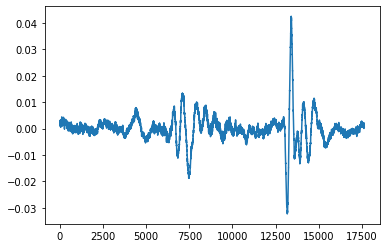

1
130


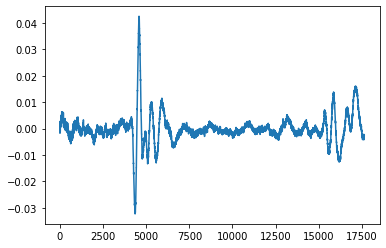

0
131


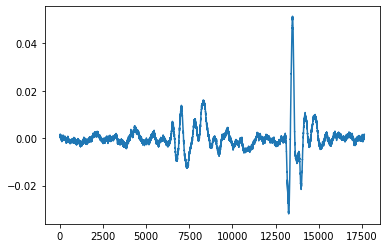

1
132


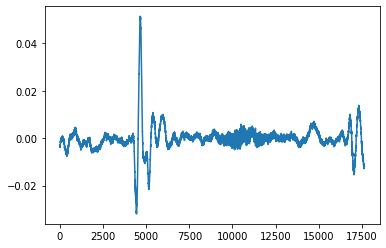

0
133


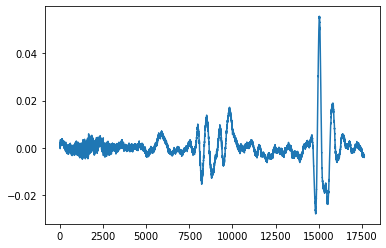

1
134


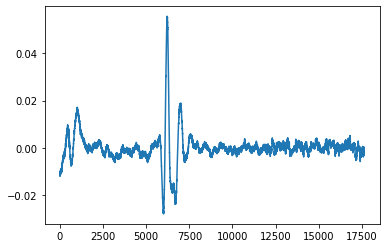

0
135


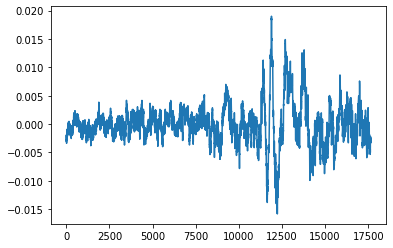

0
136


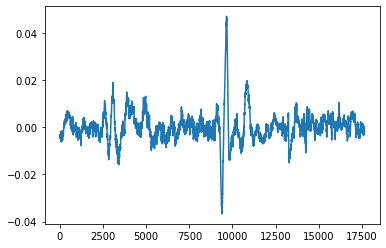

1
137


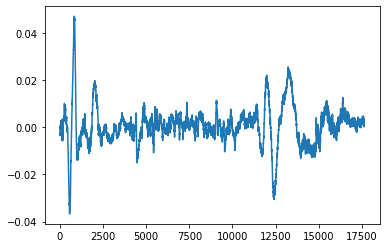

0
138


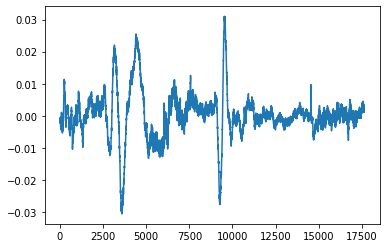

1
139


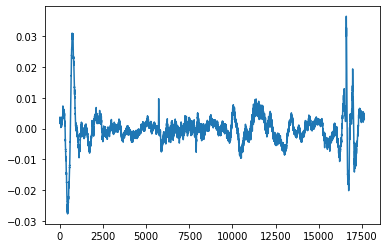

0
140


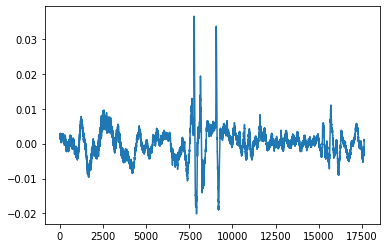

0
141


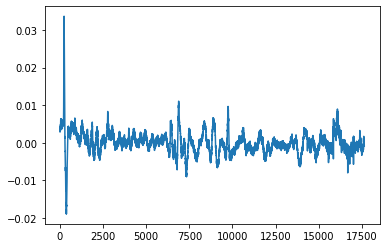

0
142


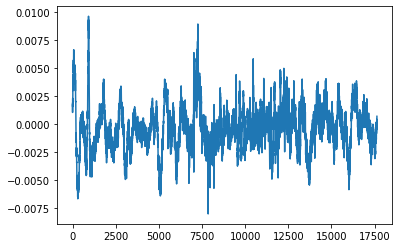

0
143


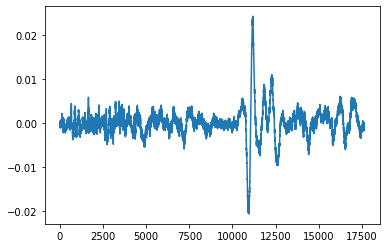

0
144


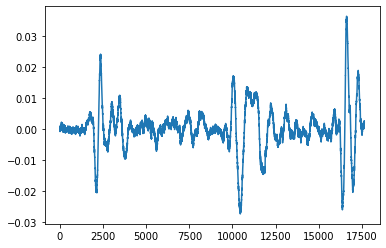

1
145


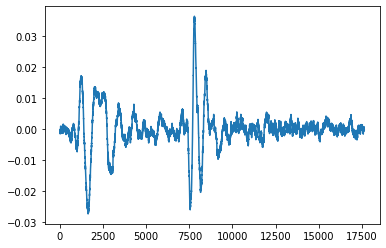

1
146


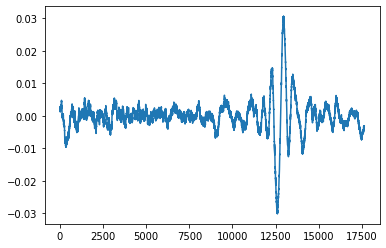

0
147


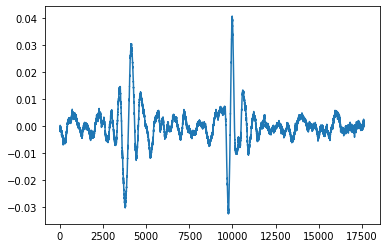

1
148


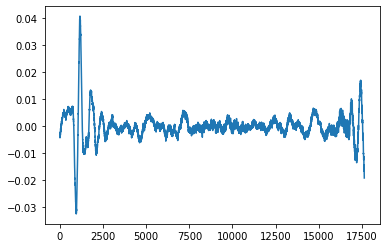

0
149


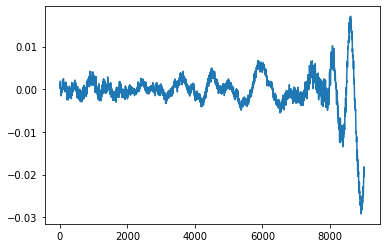

0
150


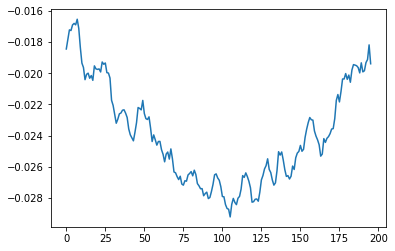

0


In [41]:
wide = 0.4
hop= int(sr*wide/2)
sr = 44100
windows = range(0,x.shape[0],hop)
my_data_mfcc = np.ndarray([len(windows),20]) 
my_target = np.ndarray([len(windows)]) 
for i,wind in enumerate(windows):
    dta = x[(wind):(wind+2*hop)]
    print(i)
    ipd.display(ipd.Audio(dta,rate=sr))
    my_data_mfcc[i] = mfcc(dta,sr,1/sr*(2*hop),1/sr*(2*hop), numcep = 20, nfft = 17640 )[0]
    plt.plot(dta)
    plt.show()
    #print(mfcc_dta)
    #plt.plot(my_data_mfcc[i])
    if (i>115):
        my_target[i] = int(input())

In [48]:
save = np.append(save[:116],my_target[116:])
my_target.shape, save.shape

((151,), (151,))

In [51]:
np.save(audio_path.split(".")[0]+"_mfcc.npy",my_data_mfcc)
np.save(audio_path.split(".")[0]+"_target.npy",my_target)

In [5]:
import python_speech_features
from python_speech_features import mfcc
mfcc_feat = mfcc(x,44100,0.4,0.2, nfft=17640 )

In [48]:
mfcc_feat.shape,

((150, 13),)

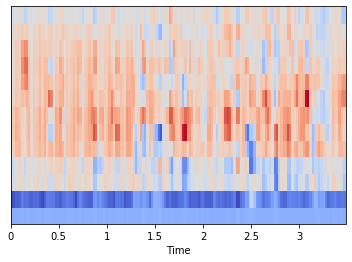

In [51]:
librosa.display.specshow(np.transpose(mfcc_feat), x_axis='time')

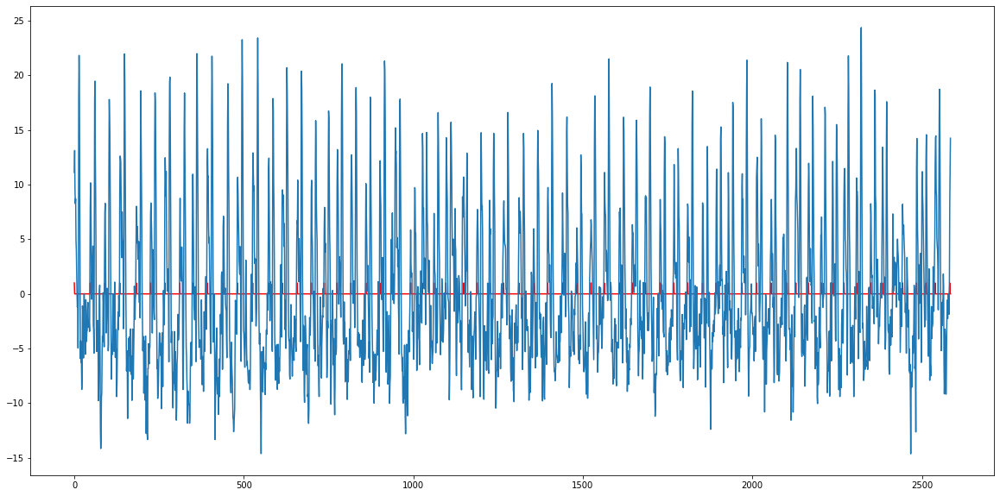

In [8]:
plt.figure(figsize =[20,10])
h_mark = np.zeros(m_htk.shape[1])
mark = np.zeros(m_htk.shape[1])
m1 = np.zeros(m_htk.shape[1]) + 5.5
m2 = np.zeros(m_htk.shape[1]) + 14.65
mark = m_htk[:12,:].sum(axis = 0)
h_mark = (mark<m2) 
h_mark = (mark>m1) & h_mark
h_mark = h_mark
for i in range(h_mark.shape[0]):
    if i>25:
        if h_mark[i-25:i].sum():
            h_mark[i]=0
    else:
        if h_mark[:i].sum():
            h_mark[i]=0
                
plt.plot(h_mark[:], color = 'r')
plt.plot(mark[:])
#plt.plot(m1[:])
#plt.plot(m2[:])

In [50]:
h_mark.sum()

66

In [34]:
target = h_mark
data = np.transpose(m_htk)
import sklearn
from sklearn.model_selection import train_test_split  
test, train, target_test, target_train = train_test_split(data, target, train_size=0.3,shuffle = False)


In [35]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors= 3).fit(train,target_train)
predict = model.predict(test)


In [36]:
from sklearn.metrics import accuracy_score
accuracy_score(predict,target_test)

0.9780645161290322

In [26]:
audio_path = "raw_data/без_насадки_78 .wav"
x1 , sr = librosa.load(audio_path)
sr = 44100

In [37]:
xdata = x1[:1000000]
X = librosa.feature.mfcc(y=tx, sr=sr)
spectrum = np.transpose(sklearn.preprocessing.scale(X, axis=1))

C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\Mac\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [38]:
pred = model.predict(spectrum)

In [46]:
pred.sum(), xdata.shape[0]/pred.shape[0]

(18, 386.84719535783364)

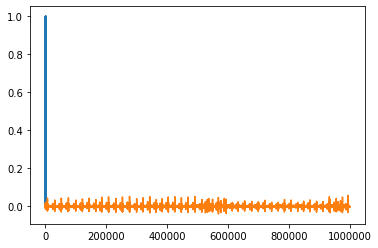

In [42]:
plt.plot(pred)
plt.plot(xdata)

In [ ]:
%matplotlib notebook
plt.plot(h_mark)
for i in range(5):
    input()
    plt.show()